## Import all required libraries

In [1]:
import os
import cv2
import json
import albumentations as A
import matplotlib.pyplot as plt
import os
import json
import shutil
import random
import numpy as np
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split

C:\Users\omcch\AppData\Roaming\Python\Python312\site-packages\albumentations\__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.1 (you have 1.4.24). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


## Extract Data from all folders 

In [47]:
folders = [
    r".\Our_Dataset\Data Folders\Pcb Image\Pcb Image 1",
    r".\Our_Dataset\Data Folders\Pcb Image 2\Pcb Image 2",
    r".\Our_Dataset\Data Folders\Pcb Image 3\Pcb Image 3",
    r".\Our_Dataset\Data Folders\Pcb Image 4\Pcb Image 4",
    r".\Our_Dataset\Data Folders\Pcb Image 5\Pcb Image 5",
    r".\Our_Dataset\Data Folders\Pcb Image 6\Pcb Image 6",
    r".\Our_Dataset\Data Folders\Pcb Image 7\Pcb Image 7",
    r".\Our_Dataset\Data Folders\Pcb Image 8\Pcb Image 8",
    r".\Our_Dataset\Data Folders\Pcb Image 9\Pcb Image 9",
    r".\Our_Dataset\Data Folders\Pcb Image 10\Pcb Image 10",
    r".\Our_Dataset\Data Folders\Pcb Image 11\Pcb Image 11",
    r".\Our_Dataset\Data Folders\Pcb Image 12\Pcb Image 12",
]
target_folder = r".\Our_Dataset\Combined_Pcb_Images"
os.makedirs(target_folder, exist_ok=True)

counter = 1
for folder in folders:
    for filename in os.listdir(folder):
        filepath = os.path.join(folder, filename)     
 
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            new_image_name = f"image_{counter}.png"
            shutil.copy(filepath, os.path.join(target_folder, new_image_name))
            
            json_filepath = os.path.join(folder, f"{os.path.splitext(filename)[0]}.json")
            if os.path.exists(json_filepath):
                new_json_name = f"image_{counter}.json"
                shutil.copy(json_filepath, os.path.join(target_folder, new_json_name))
            
            counter += 1

## Rename, Crop and Save

In [3]:
import os
import json

# Change path accordingly
target_folder = r".\Our_Dataset\Combined_Pcb_Images"

# Define class renaming and combining rules
rename_rules = {
    "Solder maximum": "Improper Solder",
    "Pseudo solder": "Improper Solder",
    "Solder insufficient": "Improper Solder",
    "Component shifted": "Component Placing Problem",
    "Extra solder": "Improper Solder",
    "Mis align component": "Component Placing Problem",
    "Mising align component": "Component Placing Problem",
    "Mising component": "Missing Component",
    "Worng Polarity": "Unknown Fault",
    "Bridge": "Unknown Fault",
    "Upside Down Component": "Unknown Fault",
    "Worng component": "Wrong Component",
}


for file_name in os.listdir(target_folder):
    if file_name.endswith(".json"):
        json_file_path = os.path.join(target_folder, file_name)
        
        
        with open(json_file_path, "r") as file:
            data = json.load(file)

       
        modified = False
        for shape in data.get("shapes", []): 
            current_label = shape.get("label")
            if current_label in rename_rules:
                print(f"File: {file_name} | Changing '{current_label}' to '{rename_rules[current_label]}'")
                shape["label"] = rename_rules[current_label]
                modified = True

  
        if modified:
            with open(json_file_path, "w") as file:
                json.dump(data, file, indent=4)
            print(f"File: {file_name} updated successfully.\n")
        else:
            print(f"File: {file_name} had no changes.\n")

print("All JSON files processed!")


File: image_1.json had no changes.

File: image_10.json had no changes.

File: image_100.json had no changes.

File: image_101.json had no changes.

File: image_102.json had no changes.

File: image_103.json had no changes.

File: image_104.json had no changes.

File: image_105.json had no changes.

File: image_106.json had no changes.

File: image_107.json had no changes.

File: image_108.json had no changes.

File: image_109.json had no changes.

File: image_11.json had no changes.

File: image_110.json had no changes.

File: image_111.json had no changes.

File: image_112.json had no changes.

File: image_113.json had no changes.

File: image_114.json had no changes.

File: image_115.json had no changes.

File: image_116.json had no changes.

File: image_117.json had no changes.

File: image_118.json had no changes.

File: image_119.json had no changes.

File: image_12.json had no changes.

File: image_120.json had no changes.

File: image_121.json had no changes.

File: image_122.j

In [5]:
def crop_and_save_components(annotation_folder, output_folder):
    for filename in os.listdir(annotation_folder):
        if filename.endswith(".json"):
            json_path = os.path.join(annotation_folder, filename)
            image_path = os.path.join(annotation_folder, filename.replace(".json", ".png"))
            if not os.path.exists(image_path):
                continue
            
            # Load image and JSON
            image = cv2.imread(image_path)
            if image is None:
                print(f"Failed to load image: {image_path}")
                continue
            
            with open(json_path, "r") as f:
                annotations = json.load(f)
            
            for i, shape in enumerate(annotations["shapes"]):
                points = shape["points"]
                label = shape["label"]
                
                # Same logic as rectangle drawing
                start_point = tuple(map(int, points[0]))
                end_point = tuple(map(int, points[1]))
                
                # Normalize to top-left and bottom-right
                x1, y1 = min(start_point[0], end_point[0]), min(start_point[1], end_point[1])
                x2, y2 = max(start_point[0], end_point[0]), max(start_point[1], end_point[1])
                
                # Clip coordinates to the image dimensions
                height, width = image.shape[:2]
                x1, y1 = max(0, x1), max(0, y1)
                x2, y2 = min(width, x2), min(height, y2)
                
                # Check if the box is valid
                if x1 >= x2 or y1 >= y2:
                    print(f"Invalid bounding box for {filename}: {points}")
                    continue
                
                cropped = image[y1:y2, x1:x2]
                
                # Create a folder for the label
                label_folder = os.path.join(output_folder, label)
                os.makedirs(label_folder, exist_ok=True)
                
                # Save the cropped image
                crop_filename = f"{filename.replace('.json', '')}_component_{i}.png"
                cv2.imwrite(os.path.join(label_folder, crop_filename), cropped)

                
annotation_folder = r".\Our_Dataset\Combined_Pcb_Images"
output_folder = r".\Our_Dataset\Cropped_Components"
os.makedirs(output_folder, exist_ok=True)
crop_and_save_components(annotation_folder, output_folder)


def count_images_in_folders(base_folder):
    fault_counts = {}
    
    # Iterate through subfolders in the base folder
    for label_folder in os.listdir(base_folder):
        label_path = os.path.join(base_folder, label_folder)
        
        # Check if it's a directory
        if os.path.isdir(label_path):
            # Count the number of image files in the folder
            image_count = len([file for file in os.listdir(label_path) if file.endswith(('.png', '.jpg', '.jpeg'))])
            fault_counts[label_folder] = image_count
    
    # Print the results
    for fault, count in fault_counts.items():
        print(f"{fault}: {count} images")
    
    return fault_counts

# Specify the output folder where cropped images are stored
output_folder = r".\Our_Dataset\Cropped_Components"
fault_image_counts = count_images_in_folders(output_folder)

Bridge: 7 images
Component shifted: 442 images
Extra solder: 45 images
Good Solder: 1561 images
Mis align component: 104 images
Mising align component: 13 images
Mising component: 369 images
Pseudo solder: 101 images
Solder insufficient: 361 images
Solder maximum: 57 images
Tombstone: 49 images
Unknown fault: 30 images
Upside Down Component: 1 images
Worng component: 116 images
Worng Polarity: 1 images


## Yolo Data Formatting

In [7]:
# Paths
input_path = r".\Our_Dataset\Combined_Pcb_Images"  
output_path = r".\Our_Dataset\YOLO_Format"

image_train_path = os.path.join(output_path, "images", "train")
label_train_path = os.path.join(output_path, "labels", "train")
image_val_path = os.path.join(output_path, "images", "val")
label_val_path = os.path.join(output_path, "labels", "val")
os.makedirs(image_train_path, exist_ok=True)
os.makedirs(label_train_path, exist_ok=True)
os.makedirs(image_val_path, exist_ok=True)
os.makedirs(label_val_path, exist_ok=True)

dataset_files = []
for file in os.listdir(input_path):
    if file.endswith(".json"):
        json_path = os.path.join(input_path, file)
        image_name = file.replace(".json", ".png")  
        image_path = os.path.join(input_path, image_name)

        
        if not os.path.exists(image_path):
            print(f"Missing image for {file}, skipping.")
            continue

        dataset_files.append((json_path, image_path))

random.seed(42)  
random.shuffle(dataset_files)
split_index = int(len(dataset_files) * 0.7)
train_files = dataset_files[:split_index]
val_files = dataset_files[split_index:]

def process_files(files, image_output_path, label_output_path):
    for json_path, image_path in files:
        with open(json_path, "r") as f:
            data = json.load(f)

       
        img_width = data.get("imageWidth")
        img_height = data.get("imageHeight")
        if not img_width or not img_height:
            print(f"Missing image dimensions in {json_path}, skipping.")
            continue

        yolo_annotations = []
        for shape in data["shapes"]:
            if shape["shape_type"] == "rectangle":
                x_min, y_min = shape["points"][0]
                x_max, y_max = shape["points"][1]

              
                x_center = ((x_min + x_max) / 2) / img_width
                y_center = ((y_min + y_max) / 2) / img_height
                width = abs((x_max - x_min)) / img_width
                height = abs((y_max - y_min)) / img_height

          
                yolo_annotations.append(f"0 {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}")

      
        label_file = os.path.join(label_output_path, os.path.basename(json_path).replace(".json", ".txt"))
        with open(label_file, "w") as f:
            f.write("\n".join(yolo_annotations))

    
        output_image_path = os.path.join(image_output_path, os.path.basename(image_path))
        shutil.copy(image_path, output_image_path)


process_files(train_files, image_train_path, label_train_path)
process_files(val_files, image_val_path, label_val_path)

print("Dataset conversion and splitting complete.")

Dataset conversion and splitting complete.


## Model Training

In [3]:
from ultralytics import YOLO
import os

# Paths
dataset_path = r".\Our_Dataset\YOLO_Format"
data_yaml = os.path.join(dataset_path, "data.yaml")

# Generate data.yaml
data_yaml_content = f"""
train: {os.path.join(dataset_path, 'images/train')}
val: {os.path.join(dataset_path, 'images/val')}
nc: 1
names: ['component']  # Single class for ROI
"""
with open(data_yaml, "w") as f:
    f.write(data_yaml_content)

# Load a pretrained YOLOv8 model
model = YOLO('yolov8n.pt')  

model.train(
    data=data_yaml,
    epochs=75,           # Maximum number of epochs
    imgsz=1536,          # Matches image dimensions closely
    batch= 16,            # Adjust based on system memory
    workers=6,           # Reduce workers if CPU is overloaded
    patience=20,          # Stop if no improvement for 5 consecutive epochs
    name="pcb_detection" # Save run with this name
)
# Validate the model
metrics = model.val()

saved_model_path = "pcb_detection_best.pt"  # File name for the saved model
model.export(format="torchscript", path=saved_model_path)  # Save the model in TorchScript format
print(f"Model saved as {saved_model_path}")

New https://pypi.org/project/ultralytics/8.3.67 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.56  Python-3.12.4 torch-2.5.1+cpu CPU (Intel Core(TM) Ultra 7 155H)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=E:\Our_Dataset\YOLO_Format\data.yaml, epochs=75, time=None, patience=20, batch=16, imgsz=1536, save=True, save_period=-1, cache=False, device=None, workers=6, project=None, name=pcb_detection11, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, sho

train: Scanning E:\Our_Dataset\YOLO_Format\labels\train.cache... 127 images, 0 backgrounds, 0 corrupt: 100%|██████████|

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning E:\Our_Dataset\YOLO_Format\labels\val.cache... 55 images, 0 backgrounds, 0 corrupt: 100%|██████████| 55/5

Plotting labels to runs\detect\pcb_detection11\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 1536 train, 1536 val
Using 0 dataloader workers
Logging results to runs\detect\pcb_detection11
Starting training for 75 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/75         0G      1.388      2.608      1.438        473       1536: 100%|██████████| 8/8 [03:19<00:00, 24.93
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:26<0

                   all         55       1007     0.0482       0.79       0.56      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/75         0G       1.14      1.641      1.244        378       1536: 100%|██████████| 8/8 [03:16<00:00, 24.50
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:26<0

                   all         55       1007      0.793       0.72      0.826      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/75         0G      1.072      1.238      1.165        405       1536: 100%|██████████| 8/8 [03:18<00:00, 24.79
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:25<0

                   all         55       1007      0.799      0.674      0.819      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/75         0G      1.083      1.121      1.139        421       1536: 100%|██████████| 8/8 [03:25<00:00, 25.63
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:26<0

                   all         55       1007      0.748      0.841      0.785      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/75         0G       1.12      1.074      1.144        606       1536: 100%|██████████| 8/8 [03:12<00:00, 24.00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:26<0

                   all         55       1007      0.847      0.731      0.858      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/75         0G      1.075       1.01      1.137        414       1536: 100%|██████████| 8/8 [03:13<00:00, 24.22
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:27<0

                   all         55       1007      0.811      0.802      0.873      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/75         0G      1.027     0.9897      1.138        417       1536: 100%|██████████| 8/8 [03:13<00:00, 24.13
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:27<0

                   all         55       1007      0.862      0.816      0.895      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/75         0G      1.025     0.9957      1.132        459       1536: 100%|██████████| 8/8 [03:13<00:00, 24.18
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:27<0

                   all         55       1007      0.889      0.794      0.903      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/75         0G     0.9886     0.9009      1.084        352       1536: 100%|██████████| 8/8 [03:14<00:00, 24.33
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:26<0

                   all         55       1007      0.875      0.851      0.906       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/75         0G      1.043     0.8889      1.103        481       1536: 100%|██████████| 8/8 [03:15<00:00, 24.43
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:26<0

                   all         55       1007      0.799      0.795      0.853      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/75         0G      1.012     0.8899      1.093        444       1536: 100%|██████████| 8/8 [03:13<00:00, 24.17
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:25<0

                   all         55       1007      0.839      0.818      0.838      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/75         0G      1.026     0.8274      1.096        471       1536: 100%|██████████| 8/8 [03:15<00:00, 24.49
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:25<0

                   all         55       1007      0.781      0.789      0.827      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/75         0G      1.024      0.836      1.098        421       1536: 100%|██████████| 8/8 [03:14<00:00, 24.36
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:25<0

                   all         55       1007      0.832      0.811      0.844       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/75         0G      1.034     0.8022      1.096        494       1536: 100%|██████████| 8/8 [03:15<00:00, 24.47
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:25<0

                   all         55       1007      0.902      0.859      0.915      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/75         0G      0.986     0.8215      1.104        368       1536: 100%|██████████| 8/8 [03:11<00:00, 23.93
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:25<0

                   all         55       1007      0.881      0.752      0.843      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/75         0G     0.9904     0.7722      1.095        348       1536: 100%|██████████| 8/8 [03:16<00:00, 24.51
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:26<0

                   all         55       1007      0.922      0.848      0.913      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/75         0G     0.9656      0.754      1.079        418       1536: 100%|██████████| 8/8 [03:17<00:00, 24.64
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:26<0

                   all         55       1007      0.926      0.881      0.935       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/75         0G      0.985     0.7183      1.062        369       1536: 100%|██████████| 8/8 [03:18<00:00, 24.81
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:25<0

                   all         55       1007      0.895      0.897      0.916      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/75         0G     0.9822     0.6987       1.06        355       1536: 100%|██████████| 8/8 [03:17<00:00, 24.68
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:25<0

                   all         55       1007      0.887      0.854      0.889      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/75         0G     0.9656     0.6923      1.091        350       1536: 100%|██████████| 8/8 [03:13<00:00, 24.18
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:25<0

                   all         55       1007      0.912      0.872      0.924      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/75         0G     0.9318     0.6787      1.066        583       1536: 100%|██████████| 8/8 [03:14<00:00, 24.27
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:24<0

                   all         55       1007      0.915      0.914      0.952       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/75         0G     0.9777     0.6716       1.07        550       1536: 100%|██████████| 8/8 [03:17<00:00, 24.75
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:24<0

                   all         55       1007      0.915      0.908      0.932      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/75         0G     0.9507     0.6397      1.055        474       1536: 100%|██████████| 8/8 [03:14<00:00, 24.33
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.912      0.884      0.925      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/75         0G     0.9531     0.6414      1.064        319       1536: 100%|██████████| 8/8 [03:15<00:00, 24.38
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:24<0

                   all         55       1007      0.915      0.912      0.943      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/75         0G     0.9218     0.6266      1.052        442       1536: 100%|██████████| 8/8 [03:14<00:00, 24.30
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:24<0

                   all         55       1007      0.923      0.913      0.953      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/75         0G     0.9333     0.6124      1.037        448       1536: 100%|██████████| 8/8 [03:16<00:00, 24.57
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.927      0.911      0.946      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/75         0G     0.9094     0.6268      1.048        376       1536: 100%|██████████| 8/8 [03:13<00:00, 24.23
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:24<0

                   all         55       1007      0.918      0.848      0.902      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/75         0G     0.8678     0.5849      1.026        461       1536: 100%|██████████| 8/8 [03:14<00:00, 24.27
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:24<0

                   all         55       1007      0.912      0.915       0.94      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/75         0G     0.8919     0.5824      1.026        395       1536: 100%|██████████| 8/8 [03:13<00:00, 24.18
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.941      0.902      0.949      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/75         0G     0.8952     0.5671      1.028        365       1536: 100%|██████████| 8/8 [03:16<00:00, 24.55
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.939      0.902      0.949      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/75         0G     0.8908     0.5825       1.04        386       1536: 100%|██████████| 8/8 [03:14<00:00, 24.34
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.916      0.913      0.941      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/75         0G     0.8818     0.5825      1.034        524       1536: 100%|██████████| 8/8 [03:12<00:00, 24.03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:24<0

                   all         55       1007      0.908      0.923      0.941      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/75         0G     0.8871     0.5523      1.017        517       1536: 100%|██████████| 8/8 [03:15<00:00, 24.39
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.917      0.923      0.947      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/75         0G     0.9162     0.5568      1.047        405       1536: 100%|██████████| 8/8 [03:13<00:00, 24.16
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.921      0.928       0.95      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/75         0G     0.8985     0.5506      1.033        453       1536: 100%|██████████| 8/8 [03:13<00:00, 24.15
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007       0.91      0.932      0.949      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/75         0G     0.8914     0.5445      1.024        480       1536: 100%|██████████| 8/8 [03:12<00:00, 24.10
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:24<0

                   all         55       1007      0.907      0.907      0.942      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/75         0G     0.8909     0.5305      1.042        384       1536: 100%|██████████| 8/8 [03:10<00:00, 23.81
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.917      0.904      0.955      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/75         0G     0.9081     0.5405      1.042        352       1536: 100%|██████████| 8/8 [03:10<00:00, 23.87
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007        0.9      0.935      0.955      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/75         0G     0.8618     0.5352      1.027        358       1536: 100%|██████████| 8/8 [03:10<00:00, 23.87
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.908      0.912      0.946       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/75         0G     0.8758     0.5261      1.015        415       1536: 100%|██████████| 8/8 [03:11<00:00, 23.92
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.922      0.933      0.954      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/75         0G     0.8606     0.5043      1.013        385       1536: 100%|██████████| 8/8 [03:13<00:00, 24.20
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.928      0.926      0.963      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/75         0G     0.8589     0.5178       1.02        514       1536: 100%|██████████| 8/8 [03:12<00:00, 24.03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007       0.91       0.94      0.955      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/75         0G      0.865     0.5091      1.003        328       1536: 100%|██████████| 8/8 [03:15<00:00, 24.41
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.934      0.913      0.953      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/75         0G     0.8584     0.5086      1.005        447       1536: 100%|██████████| 8/8 [03:14<00:00, 24.30
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.931      0.901      0.943      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/75         0G     0.8374     0.4898       1.03        341       1536: 100%|██████████| 8/8 [03:11<00:00, 23.92
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.934      0.928      0.959        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/75         0G     0.8292     0.4899      1.009        322       1536: 100%|██████████| 8/8 [03:12<00:00, 24.00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:22<0

                   all         55       1007      0.939      0.932      0.958      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/75         0G     0.8101     0.4757     0.9923        350       1536: 100%|██████████| 8/8 [03:11<00:00, 23.88
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.924      0.926      0.951      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/75         0G     0.8197     0.4798     0.9969        422       1536: 100%|██████████| 8/8 [03:14<00:00, 24.28
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:22<0

                   all         55       1007      0.927      0.903      0.941      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/75         0G     0.8108     0.4758     0.9914        511       1536: 100%|██████████| 8/8 [03:13<00:00, 24.23
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:24<0

                   all         55       1007      0.914      0.904      0.941      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/75         0G     0.8004     0.4792     0.9888        418       1536: 100%|██████████| 8/8 [03:12<00:00, 24.02
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007       0.92      0.921      0.947      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/75         0G     0.7736     0.4725     0.9849        368       1536: 100%|██████████| 8/8 [03:12<00:00, 24.10
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.915      0.942      0.959      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/75         0G     0.7975     0.4632     0.9934        391       1536: 100%|██████████| 8/8 [03:13<00:00, 24.21
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.924      0.947      0.967      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/75         0G     0.7835     0.4696     0.9891        442       1536: 100%|██████████| 8/8 [03:14<00:00, 24.26
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.924      0.929       0.96      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/75         0G     0.7774     0.4367     0.9947        558       1536: 100%|██████████| 8/8 [03:12<00:00, 24.08
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.908      0.946      0.955      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/75         0G     0.7885      0.452      1.002        480       1536: 100%|██████████| 8/8 [03:11<00:00, 23.94
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.911      0.936      0.947      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/75         0G     0.7716     0.4439     0.9843        346       1536: 100%|██████████| 8/8 [03:11<00:00, 23.94
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:22<0

                   all         55       1007      0.915      0.921      0.945      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/75         0G      0.773     0.4415     0.9803        364       1536: 100%|██████████| 8/8 [03:14<00:00, 24.28
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.919      0.923      0.949      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/75         0G     0.7615     0.4421     0.9778        429       1536: 100%|██████████| 8/8 [03:12<00:00, 24.08
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:22<0

                   all         55       1007      0.924      0.909      0.941      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/75         0G     0.7975     0.4531     0.9843        511       1536: 100%|██████████| 8/8 [03:14<00:00, 24.27
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.923      0.924      0.947      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/75         0G     0.7417      0.424     0.9721        439       1536: 100%|██████████| 8/8 [03:12<00:00, 24.08
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.929      0.931      0.953      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/75         0G     0.7489     0.4251     0.9758        334       1536: 100%|██████████| 8/8 [03:14<00:00, 24.33
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.926      0.938      0.953        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/75         0G     0.7542      0.422     0.9612        490       1536: 100%|██████████| 8/8 [03:33<00:00, 26.72
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.925      0.945      0.951      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/75         0G     0.7129     0.4065     0.9562        602       1536: 100%|██████████| 8/8 [03:12<00:00, 24.09
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.928      0.938      0.949      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/75         0G     0.7195     0.4091     0.9536        483       1536: 100%|██████████| 8/8 [03:15<00:00, 24.42
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:22<0

                   all         55       1007      0.924      0.934      0.947      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/75         0G     0.7352     0.4113     0.9605        466       1536: 100%|██████████| 8/8 [03:18<00:00, 24.85
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.916      0.947      0.946        0.7


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/75         0G     0.7397     0.4806     0.9876        302       1536: 100%|██████████| 8/8 [03:05<00:00, 23.13
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.926      0.937      0.945      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/75         0G     0.7483     0.4484     0.9703        266       1536: 100%|██████████| 8/8 [03:04<00:00, 23.05
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.921      0.939      0.944      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/75         0G     0.7128     0.4356     0.9667        358       1536: 100%|██████████| 8/8 [03:03<00:00, 22.95
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.914       0.94      0.945      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/75         0G        0.7     0.4341     0.9474        252       1536: 100%|██████████| 8/8 [03:01<00:00, 22.74
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:24<0

                   all         55       1007      0.929      0.925       0.95      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/75         0G     0.7134     0.4163     0.9586        356       1536: 100%|██████████| 8/8 [03:04<00:00, 23.12
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:22<0

                   all         55       1007      0.928      0.938      0.955      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      71/75         0G     0.6997     0.4116     0.9455        289       1536: 100%|██████████| 8/8 [03:03<00:00, 22.88
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:23<0

                   all         55       1007      0.924      0.947      0.959      0.699
EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 51, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



71 epochs completed in 4.312 hours.
Optimizer stripped from runs\detect\pcb_detection11\weights\last.pt, 6.4MB
Optimizer stripped from runs\detect\pcb_detection11\weights\best.pt, 6.4MB

Validating runs\detect\pcb_detection11\weights\best.pt...
Ultralytics 8.3.56  Python-3.12.4 torch-2.5.1+cpu CPU (Intel Core(TM) Ultra 7 155H)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:18<0


                   all         55       1007      0.915      0.942      0.959      0.708
Speed: 5.5ms preprocess, 275.7ms inference, 0.0ms loss, 13.4ms postprocess per image
Results saved to runs\detect\pcb_detection11
Ultralytics 8.3.56  Python-3.12.4 torch-2.5.1+cpu CPU (Intel Core(TM) Ultra 7 155H)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning E:\Our_Dataset\YOLO_Format\labels\val.cache... 55 images, 0 backgrounds, 0 corrupt: 100%|██████████| 55/5
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:17<0


                   all         55       1007      0.915      0.942      0.959      0.708
Speed: 4.6ms preprocess, 258.6ms inference, 0.0ms loss, 12.4ms postprocess per image
Results saved to runs\detect\pcb_detection112


SyntaxError: '[31m[1mpath[0m' is not a valid YOLO argument. Similar arguments are i.e. ['batch=16'].

    Arguments received: ['yolo', '-f', 'C:\\Users\\omcch\\AppData\\Roaming\\jupyter\\runtime\\kernel-f1c67f83-f867-4a06-a9e5-1b1efb5975f0.json']. Ultralytics 'yolo' commands use the following syntax:

        yolo TASK MODE ARGS

        Where   TASK (optional) is one of {'detect', 'obb', 'classify', 'segment', 'pose'}
                MODE (required) is one of {'track', 'val', 'export', 'train', 'predict', 'benchmark'}
                ARGS (optional) are any number of custom 'arg=value' pairs like 'imgsz=320' that override defaults.
                    See all ARGS at https://docs.ultralytics.com/usage/cfg or with 'yolo cfg'

    1. Train a detection model for 10 epochs with an initial learning_rate of 0.01
        yolo train data=coco8.yaml model=yolo11n.pt epochs=10 lr0=0.01

    2. Predict a YouTube video using a pretrained segmentation model at image size 320:
        yolo predict model=yolo11n-seg.pt source='https://youtu.be/LNwODJXcvt4' imgsz=320

    3. Val a pretrained detection model at batch-size 1 and image size 640:
        yolo val model=yolo11n.pt data=coco8.yaml batch=1 imgsz=640

    4. Export a YOLO11n classification model to ONNX format at image size 224 by 128 (no TASK required)
        yolo export model=yolo11n-cls.pt format=onnx imgsz=224,128

    5. Ultralytics solutions usage
        yolo solutions count or in ['heatmap', 'queue', 'speed', 'workout', 'analytics', 'trackzone', 'inference'] source="path/to/video/file.mp4"

    6. Run special commands:
        yolo help
        yolo checks
        yolo version
        yolo settings
        yolo copy-cfg
        yolo cfg
        yolo solutions help

    Docs: https://docs.ultralytics.com
    Solutions: https://docs.ultralytics.com/solutions/
    Community: https://community.ultralytics.com
    GitHub: https://github.com/ultralytics/ultralytics
     (<string>)

## Save Model and Prediction report in directory

In [13]:
# Export the model in TorchScript format
export_format = "torchscript"
export_dir = "exports"  # Directory where the model will be saved

os.makedirs(export_dir, exist_ok=True)  # Ensure the directory exists

model.export(format=export_format, imgsz=1536, project=export_dir)

print(f"Model exported in {export_format} format to {export_dir}")


Ultralytics 8.3.56  Python-3.12.4 torch-2.5.1+cpu CPU (Intel Core(TM) Ultra 7 155H)

PyTorch: starting from 'runs\detect\pcb_detection11\weights\best.pt' with input shape (1, 3, 1536, 1536) BCHW and output shape(s) (1, 5, 48384) (6.1 MB)

TorchScript: starting export with torch 2.5.1+cpu...
TorchScript: export success  2.0s, saved as 'runs\detect\pcb_detection11\weights\best.torchscript' (12.4 MB)

Export complete (2.5s)
Results saved to C:\Users\omcch\runs\detect\pcb_detection11\weights
Predict:         yolo predict task=detect model=runs\detect\pcb_detection11\weights\best.torchscript imgsz=1536  
Validate:        yolo val task=detect model=runs\detect\pcb_detection11\weights\best.torchscript imgsz=1536 data=E:\Our_Dataset\YOLO_Format\data.yaml  
Visualize:       https://netron.app
Model exported in torchscript format to exports


## Predicted Bounding Boxes

In [9]:

print("Validation Results:")
print(metrics)

# Additional evaluation with test data (optional, if test set exists)
test_images_path = os.path.join(dataset_path, 'images/test')  # Adjust if necessary
if os.path.exists(test_images_path):
    predictions = model.predict(
        source=test_images_path,  # Path to test images
        imgsz=1536,              # Match training image size
        conf=0.5,                # Confidence threshold
        save=True,               # Save prediction images
        save_txt=True            # Save predictions in text format
    )
    print("Test Predictions Completed. Check saved predictions for evaluation.")

# Visualize a few predictions (optional)
model.predict(source=test_images_path, imgsz=1536, conf=0.5, show=True)

Validation Results:
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001D561E48170>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0470

FileNotFoundError: E:\Our_Dataset\YOLO_Format\images/test does not exist

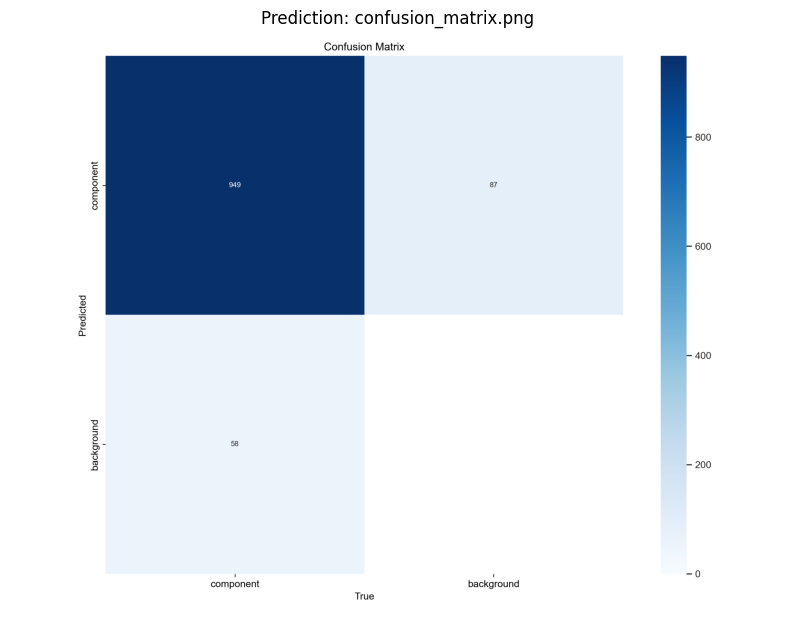

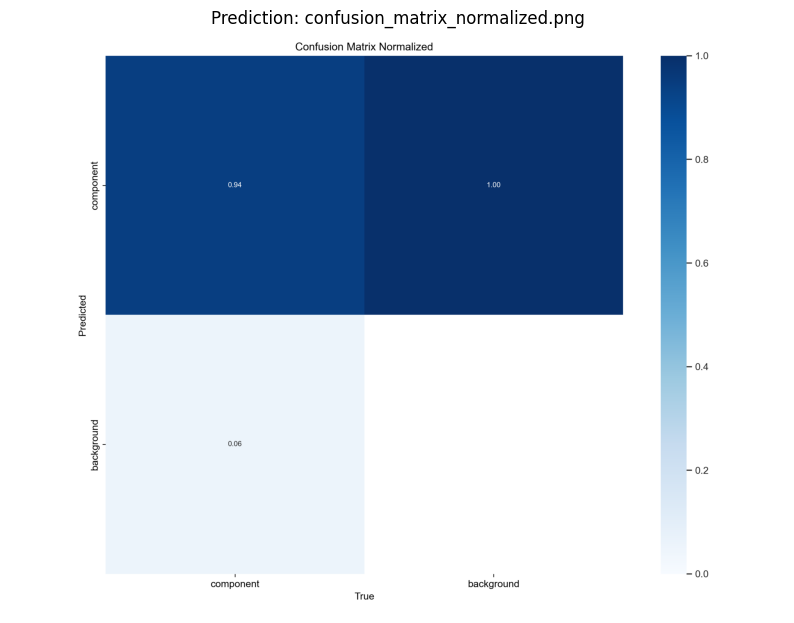

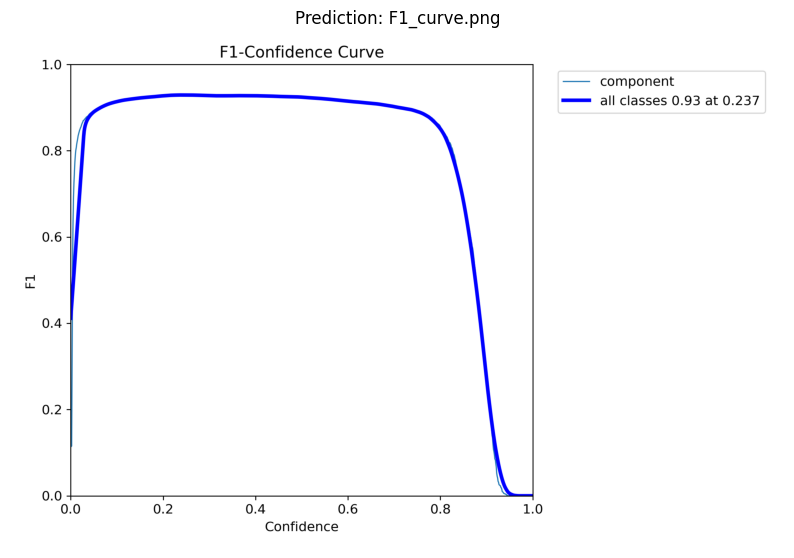

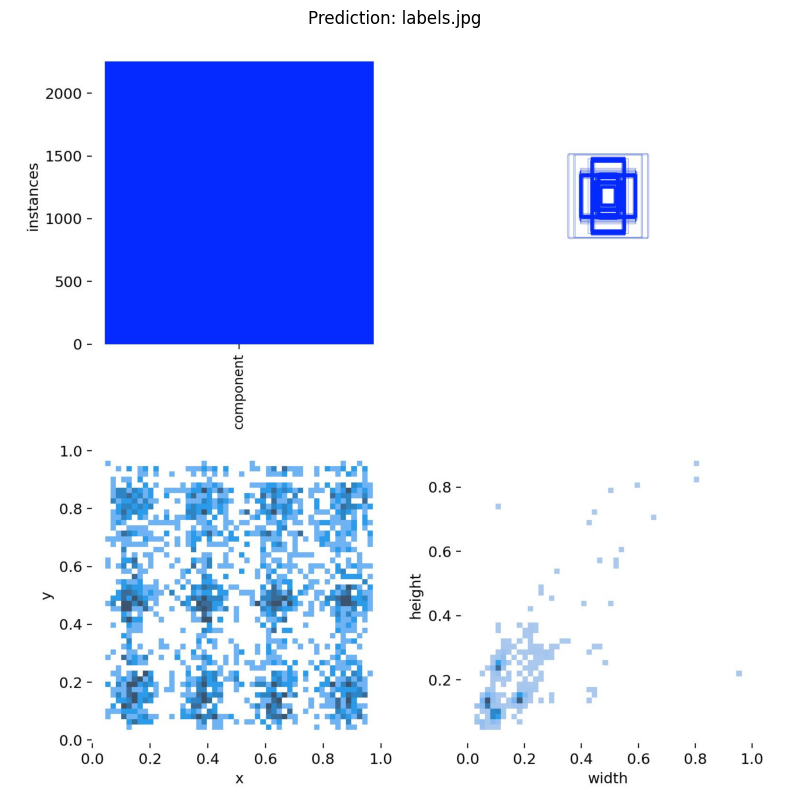

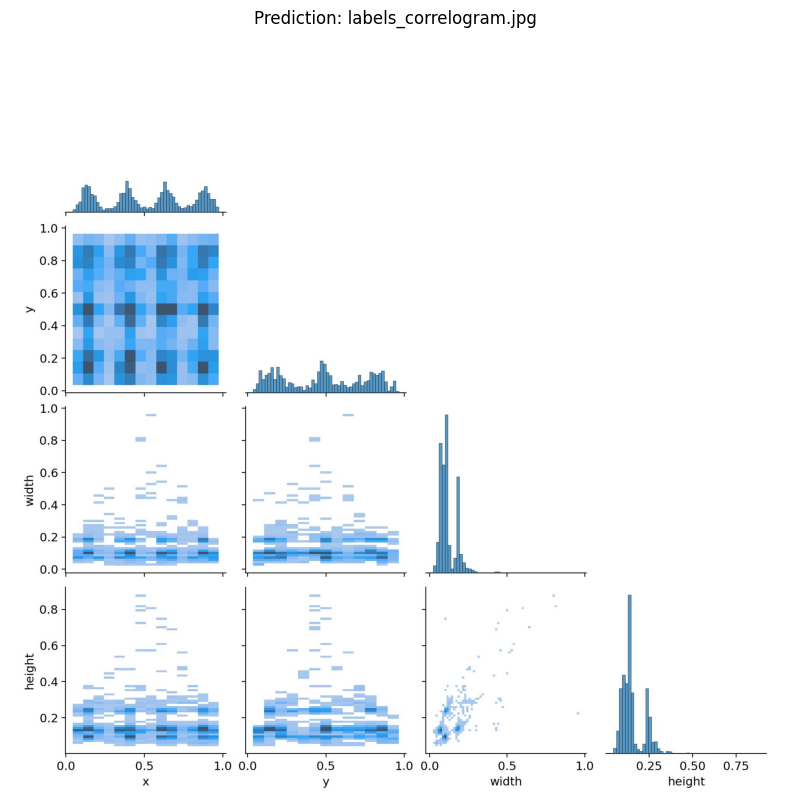

...

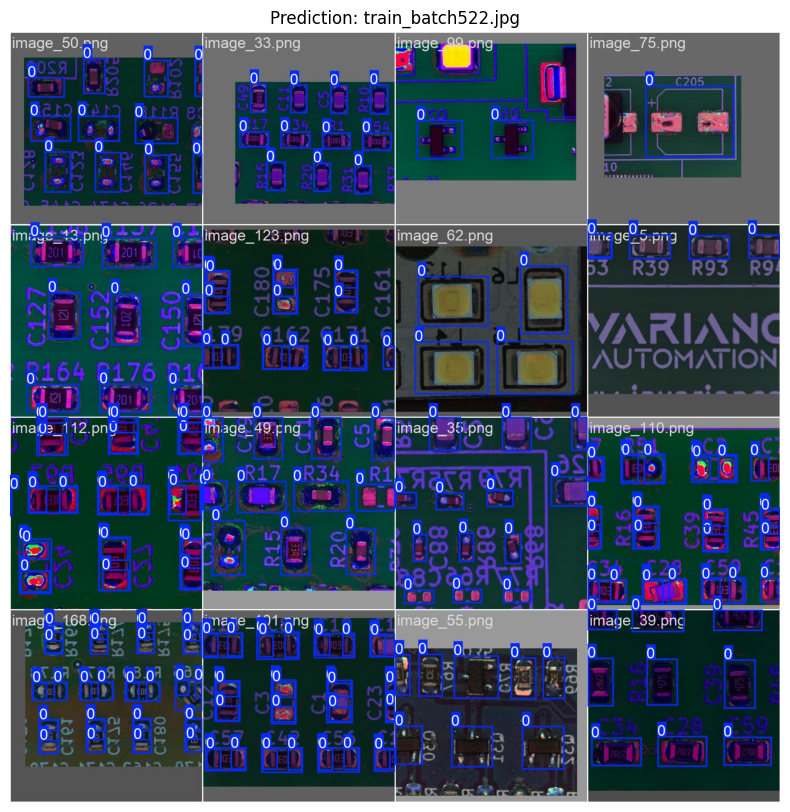

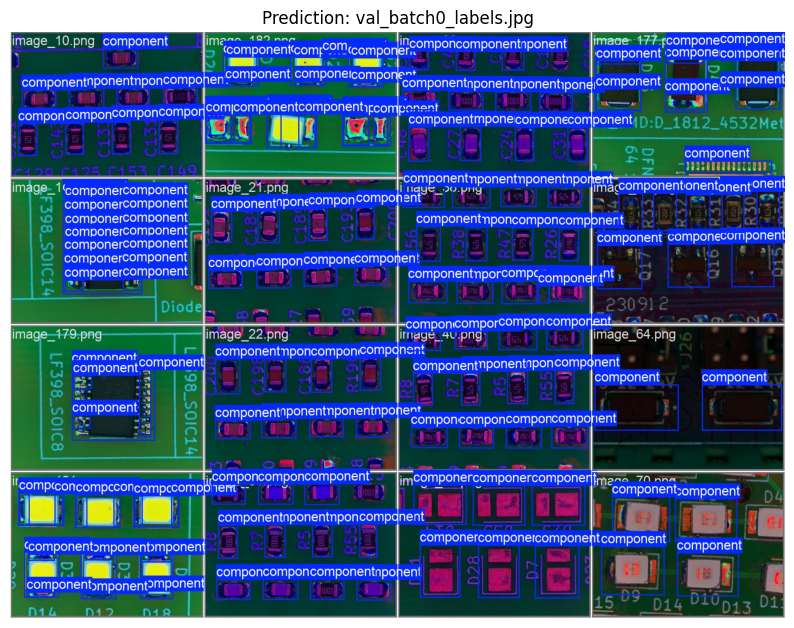

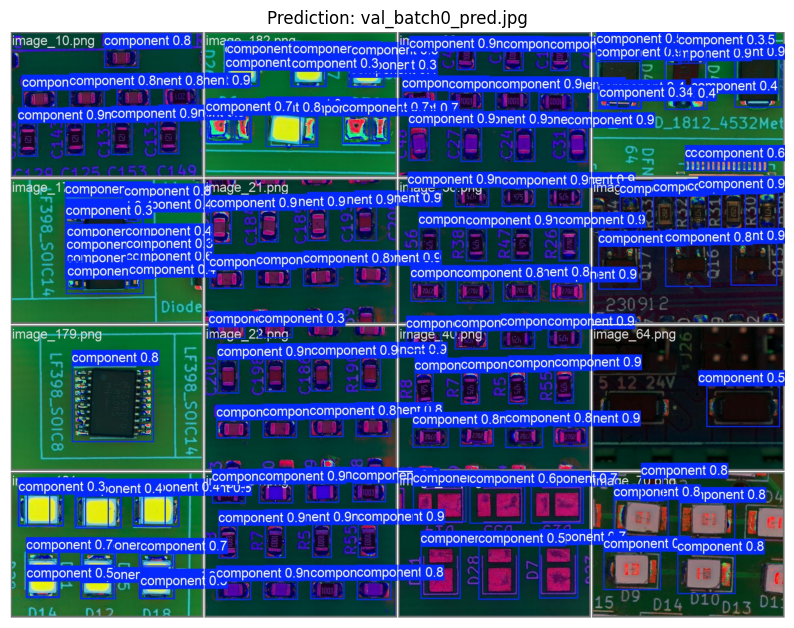

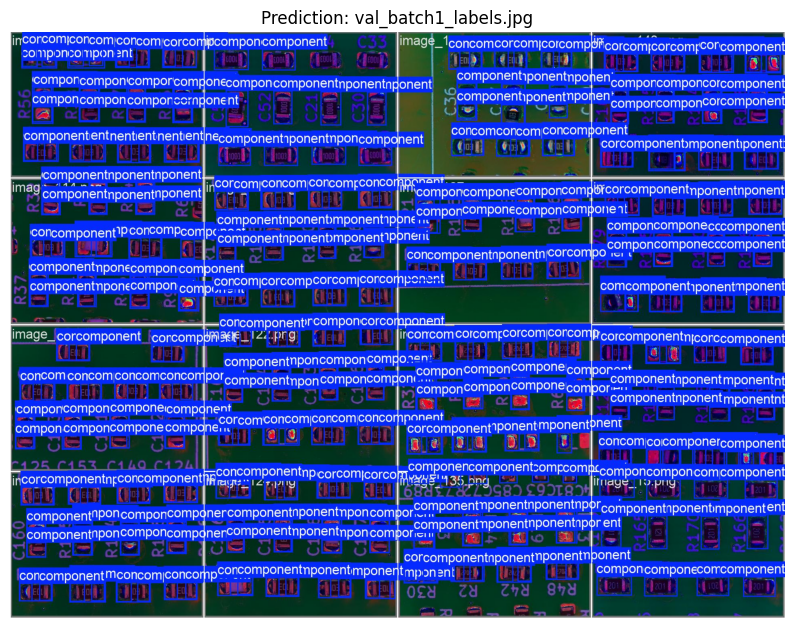

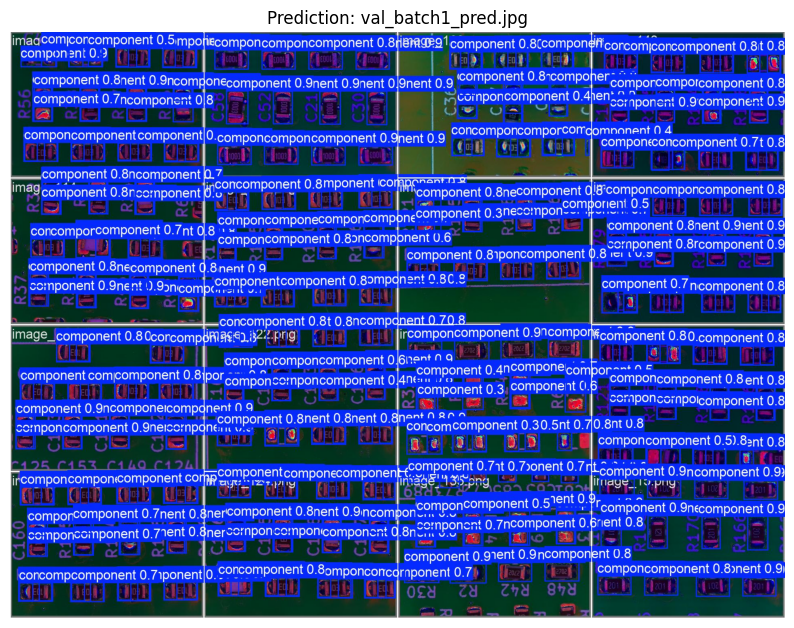

In [39]:
import os
import cv2
import matplotlib.pyplot as plt
%matplotlib inline


# Directory where YOLO saved the results
predictions_dir = r"runs\detect\pcb_detection11"  # Update based on the YOLO output message

# Check if the directory exists
if not os.path.exists(predictions_dir):
    raise FileNotFoundError(f"Directory {predictions_dir} not found. Check the YOLO output path.")

# Show saved validation result images
for image_file in os.listdir(predictions_dir):
    if image_file.endswith(".jpg") or image_file.endswith(".png"):
        image_path = os.path.join(predictions_dir, image_file)

        # Load and display the image
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        plt.axis("off")
        plt.title(f"Prediction: {os.path.basename(image_file)}")
        plt.show()
